# Download

https://mapreader.readthedocs.io/en/latest/User-guide/Download.html

In [1]:
from mapreader import SheetDownloader
my_ts = SheetDownloader(metadata_path="../NLS_metadata/metadata_OS_One_Inch_GB_WFS_light.json",
                        download_url="https://geo.nls.uk/maps/os/1inch_2nd_ed/{z}/{x}/{y}.png")

[INFO] Metadata file has 480 item(s).


In [ ]:
my_ts.extract_wfs_id_nos()
my_ts.plot_all_metadata_on_map(map_extent="uk", add_id=False)

In [3]:
my_ts.get_minmax_latlon()

[INFO] Min lat: 49.82091681, max lat: 60.97000003 
[INFO] Min lon: -8.11999993, max lon: 1.83188116


1873 1909 36


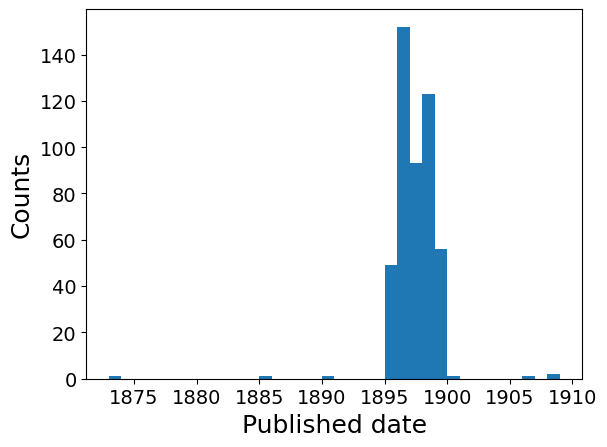

In [4]:
my_ts.hist_published_dates()


## Query maps using a list of lats/lons

In [5]:
my_ts.query_map_sheets_by_coordinates((-4.33,55.90))
my_ts.query_map_sheets_by_coordinates((-3.25,51.93), append=True)

In [6]:
my_ts.print_found_queries()

Query results:
URL:     	https://maps.nls.uk/view/74488689
coordinates (bounds):  	(-4.82999994, 55.79000003, -4.20999993, 56.05000003)
--------------------
URL:     	https://maps.nls.uk/view/101168342
coordinates (bounds):  	(-3.33544762, 51.87891401, -2.91228731, 52.05404182)
--------------------


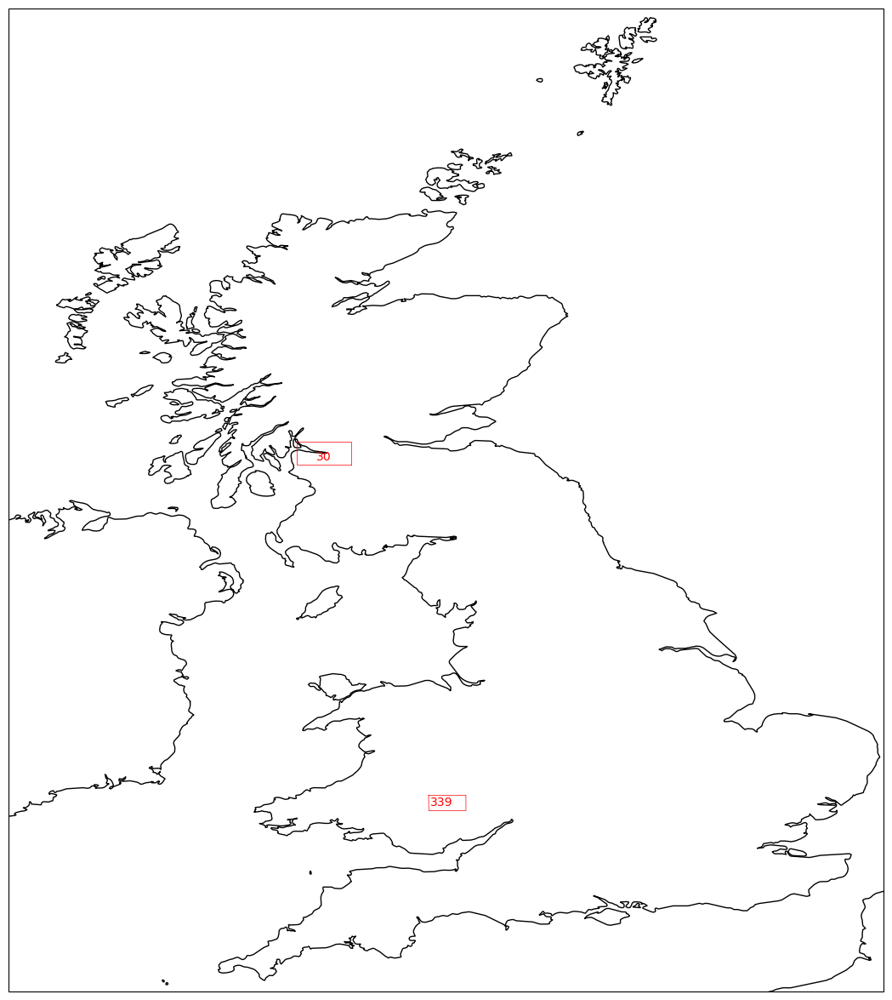

In [7]:
my_ts.plot_queries_on_map(map_extent="uk")

## Download map tiles

In [8]:
my_ts.get_grid_bb(zoom_level=14)
my_ts.download_map_sheets_by_queries(overwrite=True)

[INFO] Downloaded "map_74488689.png"
[INFO] Downloaded "map_101168342.png"


# Load

https://mapreader.readthedocs.io/en/latest/User-guide/Load.html

## Load in downloaded maps

In [9]:
from mapreader import loader

In [10]:
my_files = loader("./maps/*png")

100%|█████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.14it/s]


In [11]:
# len() shows the total number of images currently read (or sliced, see below)
print(f"Number of images: {len(my_files)}")

Number of images: 2


In [12]:
print(my_files)

#images: 2

#parents: 2
map_74488689.png
map_101168342.png

#patches: 0



In [13]:
my_files.add_metadata("./maps/metadata.csv")

[WARNING] Duplicates found in metadata. Keeping only first instance of each duplicated value


In [15]:
parent_list = my_files.list_parents()

100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.75it/s]


[<Figure size 2000x2000 with 1 Axes>]

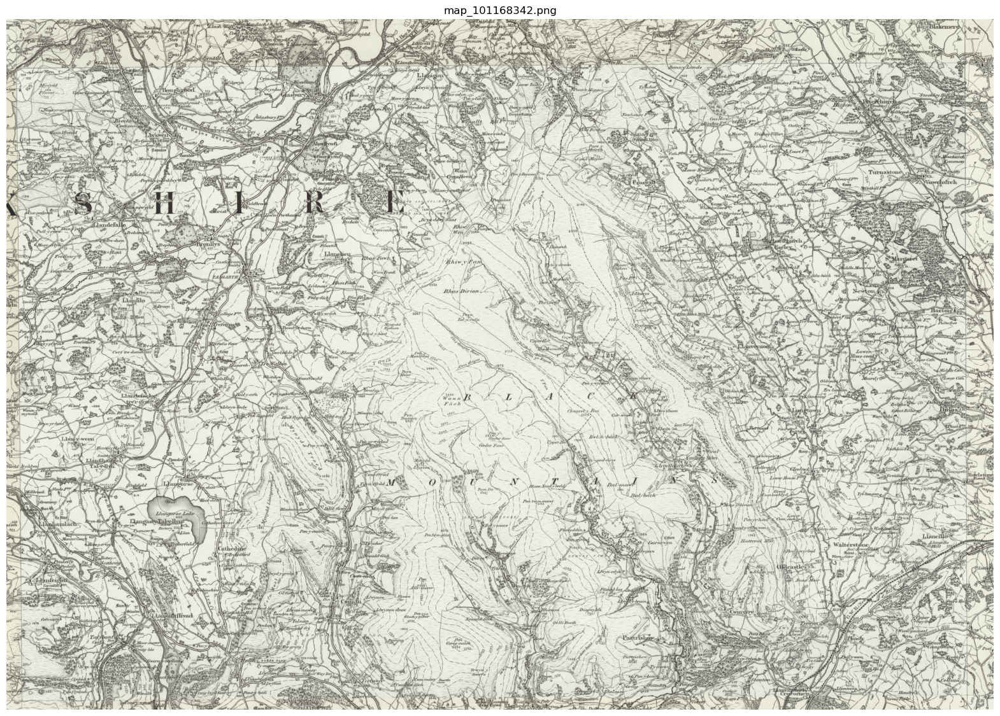

In [16]:
my_files.show(parent_list[1],
            figsize=(20, 20))

## Patchify maps

In [17]:
my_files.patchify_all(patch_size=100, # in pixels
                square_cuts=True)

[INFO] Saving patches in directory named "patches_100_pixel".


100%|█████████████████████████████████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.89s/it]


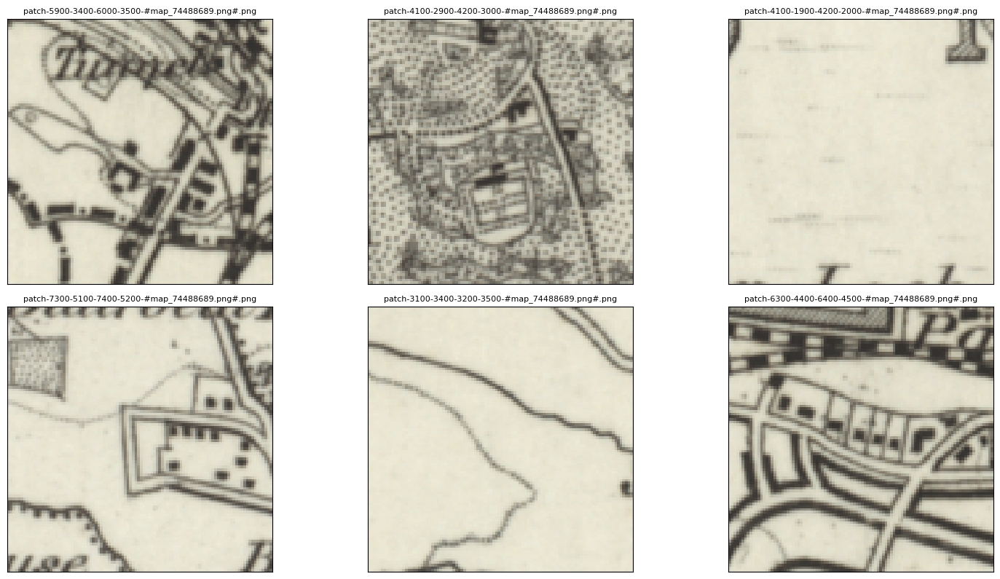

In [18]:
my_files.show_sample(num_samples=6, tree_level="patch")

100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.45s/it]


[<Figure size 1500x1500 with 1 Axes>]

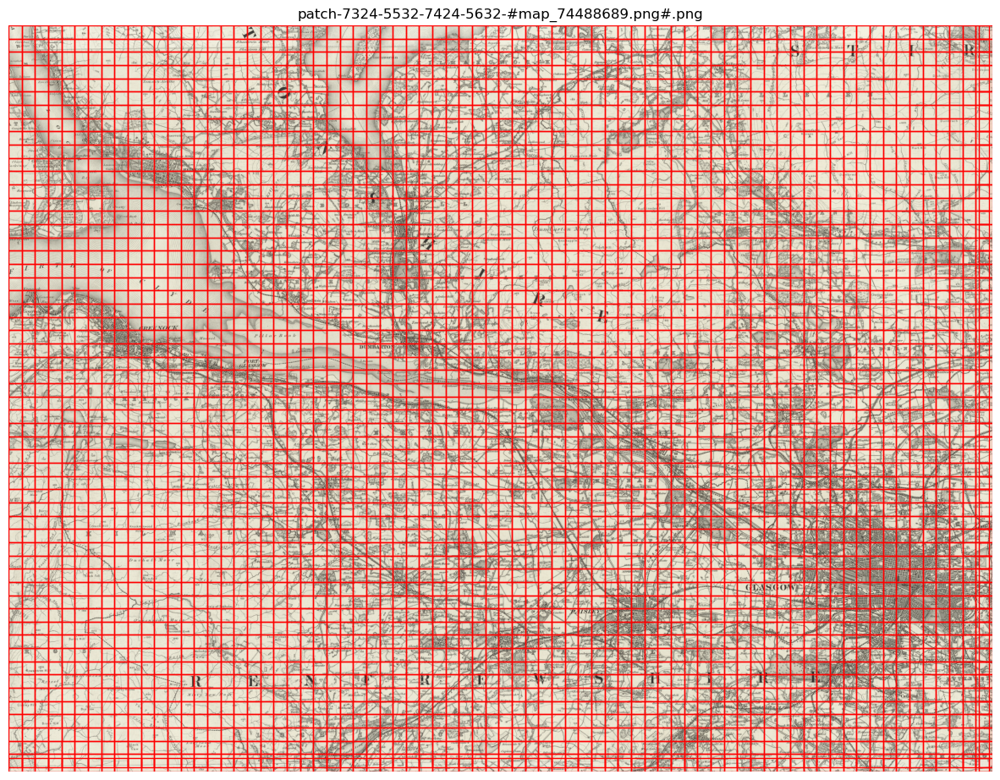

In [19]:
my_files.show_parent(parent_list[0], 
                patch_border=True, 
                plot_parent=True,
                figsize=(15, 15))

## Calculate pixel intensities

In [20]:
my_files.calc_pixel_stats()

100%|█████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.65s/it]


In [21]:
parent_df, patch_df = my_files.convert_images(save=True)

[INFO] Saved parent dataframe as "parent_df.csv"
[INFO] Saved patch dataframe as "patch_df.csv"


In [22]:
parent_df.head()

,parent_id,image_path,shape,name,url,coordinates,crs,published_date,grid_bb,patches,dlon,dlat
image_id,,,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(5632, 7424, 4)",map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.80128097118045, -4.21875, 56...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","[patch-0-0-100-100-#map_74488689.png#.png, pat...",0.000083,0.000046
map_101168342.png,None,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(3584, 5120, 4)",map_101168342.png,https://maps.nls.uk/view/101168342,"(-3.33984375, 51.89005393521691, -2.9223632812...",EPSG:4326,1896,"[(14, 8040, 5407)x(14, 8059, 5420)]","[patch-0-0-100-100-#map_101168342.png#.png, pa...",0.000082,0.000049


In [23]:
patch_df.head()

,parent_id,image_path,shape,pixel_bounds,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_A
image_id,,,,,,,,,,,,,,,
patch-0-0-100-100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(100, 100, 4)","(0, 0, 100, 100)","(-4.833984375, 55.80128097118045, -4.825697274...",EPSG:4326,POLYGON ((-4.825697274043642 55.80128097118045...,0.882480,0.875822,0.814781,1.000000,0.092767,0.095471,0.091923,0.000000
patch-0-100-100-200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(100, 100, 4)","(0, 100, 100, 200)","(-4.833984375, 55.80587061088084, -4.825697274...",EPSG:4326,POLYGON ((-4.825697274043642 55.80587061088084...,0.844518,0.836567,0.775709,0.999144,0.122864,0.126680,0.121811,0.020511
patch-0-200-100-300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(100, 100, 4)","(0, 200, 100, 300)","(-4.833984375, 55.81046025058123, -4.825697274...",EPSG:4326,POLYGON ((-4.825697274043642 55.81046025058123...,0.795914,0.784561,0.719604,1.000000,0.104913,0.107458,0.103096,0.000000
patch-0-300-100-400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(100, 100, 4)","(0, 300, 100, 400)","(-4.833984375, 55.81504989028163, -4.825697274...",EPSG:4326,POLYGON ((-4.825697274043642 55.81504989028163...,0.736126,0.723507,0.660471,1.000000,0.132483,0.136058,0.130438,0.000000
patch-0-400-100-500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(100, 100, 4)","(0, 400, 100, 500)","(-4.833984375, 55.81963952998202, -4.825697274...",EPSG:4326,POLYGON ((-4.825697274043642 55.81963952998202...,0.783474,0.770846,0.705413,1.000000,0.127172,0.129634,0.123469,0.000000


In [24]:
patch_df.mean()

mean_pixel_R    0.795482
mean_pixel_G    0.787168
mean_pixel_B    0.725940
mean_pixel_A    0.999960
std_pixel_R     0.148695
std_pixel_G     0.151217
std_pixel_B     0.142944
std_pixel_A     0.000835
dtype: float64

100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]


[<Figure size 2000x2000 with 2 Axes>]

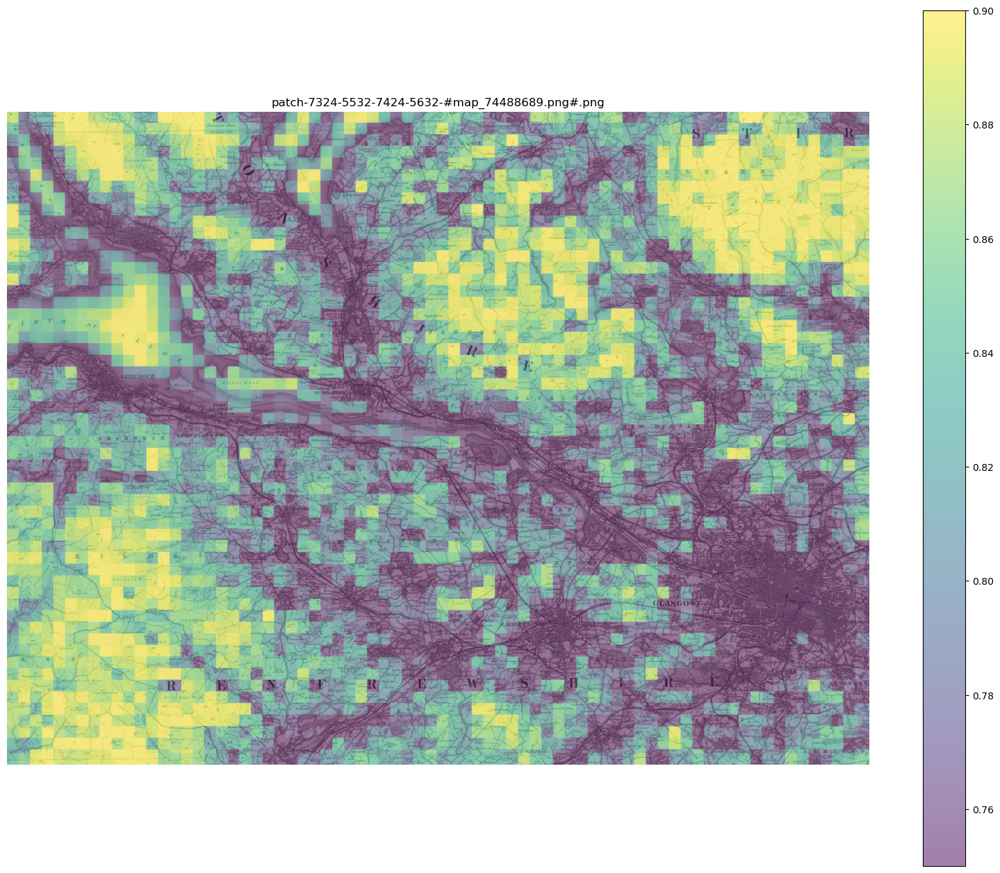

In [25]:
my_files.show_parent(parent_list[0] ,
                column_to_plot="mean_pixel_R",
                patch_border=False,
                plot_parent=True,
                vmin=0.75, 
                vmax=0.9, 
                figsize=(20, 20),
                alpha=0.5)

# Annotate
https://mapreader.readthedocs.io/en/latest/User-guide/Annotate.html

Remember to first edit `./annotation_tasks.yaml` file! It should look something like this:

```yaml
# ---------------------------------------
# Define an annotation task
# This includes:
# 1. a name (e.g., building_simple or rail_space, see below)
# 2. a list of labels to be used for this task
# ---------------------------------------
tasks:
  building_simple:
    labels: ["No", "building"]
  rail_space:
    labels: ["No", "rail space"]

# ---------------------------------------
# paths
# You need to specify:
# 1. a name (e.g., task_test_one_inch_maps_001, see below)
# 2. patch_paths: path to all the patches to be annotated
# 3. parent_paths: path to the original/parent maps/images (which were patchified)
# 4. annot_dir: directory in which the outputs will be stored
# ---------------------------------------
paths:
  task_test_one_inch_maps_001:
    patch_paths: "./patches_100_pixel/patch-*png"
    parent_paths: "./maps/*png"
    annot_dir: "./annotations_one_inch"
```

## Set up inputs

In [1]:
from mapreader.annotate.utils import prepare_annotation, save_annotation

In [5]:
userID = "rw"
annotation_tasks_file = "./annotation_tasks.yaml"
task = "rail_space"
annotation_set = "task_test_one_inch_maps_001"

# sortby="mean" sorts the patches according to the mean pixel intensities
# xoffset and yoffset specify the border size around a patch to be used as the context image (in pixel)
annotate = prepare_annotation(userID, 
                            task, 
                            annotation_tasks_file=annotation_tasks_file,
                            annotation_set=annotation_set,
                            sortby='mean',
                            context_image=False)

0it [00:00, ?it/s]
100%|█████████████████████████████████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.53s/it]

Number of already annotated images: 186
Number of images to be annotated (total): 5961
Number of images to annotate (current batch): 100


## Annotate maps and save annotations

In [6]:
annotate

Annotation(canvas=OutputCanvas(), progress=Progress(atoms=[<ipyannotate.progress.Atom object at 0x15b9486a0>, …

In [7]:
save_annotation(annotate, 
                userID, 
                task, 
                annotation_tasks_file=annotation_tasks_file,
                annotation_set=annotation_set)

[INFO] Save 53 new annotations to ./annotations_one_inch/rail_space_#rw#.csv
[INFO] 53 labels were not already stored
[INFO] Total number of saved annotations: 239


# Train
https://mapreader.readthedocs.io/en/latest/User-guide/Classify.html

## Read annotations

In [35]:
from mapreader import AnnotationsLoader

In [36]:
annotated_images = AnnotationsLoader()

annotated_images.load("./annotations_one_inch/rail_space_#rw#.csv")

[INFO] Reading "./annotations_one_inch/rail_space_#rw#.csv"
[INFO] Number of annotations:   239

[INFO] Number of instances of each label (from column "label"):
        - 1:      182
        - 2:      57



In [37]:
annotated_images.annotations

,image_id,image_path,label,label_index
0,patch-2900-1900-3000-2000-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
1,patch-6900-4300-7000-4400-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
2,patch-6600-4200-6700-4300-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
3,patch-6600-4100-6700-4200-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
4,patch-0-2100-100-2200-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
...,...,...,...,...
234,patch-3400-5300-3500-5400-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
235,patch-2600-2000-2700-2100-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
236,patch-4500-3484-4600-3584-#map_101168342.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
237,patch-4500-2100-4600-2200-#map_101168342.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0


In [11]:
print(annotated_images)

[INFO] Number of annotations:   239

[INFO] Number of instances of each label (from column "label"):
        - 1:      182
        - 2:      57



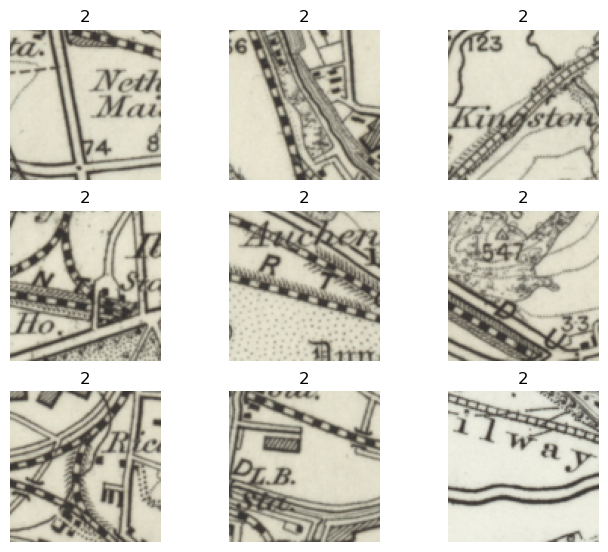

In [12]:
# show sample images for target label (tar_label)
annotated_images.show_sample(label_to_show="2")

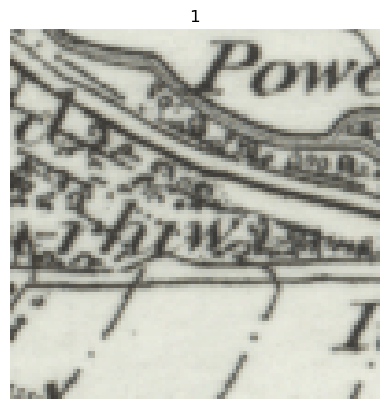

In [13]:
# show an image based on its index 
annotated_images.show_patch("patch-3800-3200-3900-3300-#map_101168342.png#.png")

In [14]:
annotated_images.review_labels()

[INFO] Type "exit", "end" or "stop" to exit.
[INFO] Showing 0-24 out of 239.

Enter IDs, comma separated (or press enter to continue): exit
[INFO] Exited.


## Prepare datasets and dataloaders

In [38]:
annotated_images.create_datasets(frac_train=0.7, frac_val=0.2, frac_test=0.1)

[INFO] Number of annotations in each set:
        - Train:        167
        - Validate:     48
        - Test:         24


In [39]:
annotated_images.datasets["train"].patch_df.head()

,image_id,image_path,label,label_index
184,patch-4700-300-4800-400-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
78,patch-1900-2500-2000-2600-#map_101168342.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
191,patch-3500-3100-3600-3200-#map_101168342.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
180,patch-1500-1100-1600-1200-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0
36,patch-6200-3100-6300-3200-#map_74488689.png#.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,1,0


In [40]:
annotated_images.labels_map

{0: '1', 1: '2'}

In [41]:
dataloaders = annotated_images.create_dataloaders(batch_size=8)

[INFO] Using default sampler.


## Set up `ClassifierContainer`

### Load a pretrained PyTorch model, dataloaders and labels map

In [42]:
from mapreader import ClassifierContainer

In [43]:
my_classifier = ClassifierContainer(model ="resnet18",
                                    dataloaders=dataloaders,
                                    labels_map={0: 'No', 1: 'rail space'})

[INFO] Device is set to cpu
[INFO] Loaded "train" with 167 items.
[INFO] Loaded "val" with 48 items.
[INFO] Loaded "test" with 24 items.
[INFO] Initializing model.


In [44]:
my_classifier.labels_map

{0: 'No', 1: 'rail space'}

[INFO] dataset: train
        - items:        167
        - batch size:   8
        - batches:      21


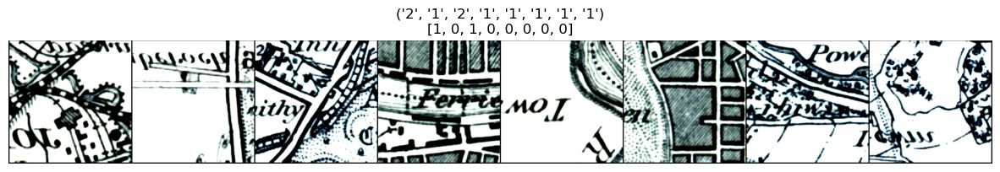

In [45]:
my_classifier.show_sample(set_name='train', batch_number=1)

In [46]:
my_classifier.model_summary()

Layer (type:depth-idx)                   Output Shape              Output Shape              Param #
ResNet                                   [8, 2]                    [8, 2]                    --
├─Conv2d: 1-1                            [8, 64, 112, 112]         [8, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [8, 64, 112, 112]         [8, 64, 112, 112]         128
├─ReLU: 1-3                              [8, 64, 112, 112]         [8, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [8, 64, 56, 56]           [8, 64, 56, 56]           --
├─Sequential: 1-5                        [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [8, 64, 56, 56]           [8, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [8, 64, 56, 56]           [8, 64, 56, 56]           128
│    │    └─ReLU: 3-3     

### Set up criterion, optimizer and scheduler

In [47]:
my_classifier.add_criterion("cross-entropy")

[INFO] Using "CrossEntropyLoss()" as criterion.


In [48]:
params_to_optimize = my_classifier.generate_layerwise_lrs(min_lr=1e-4, max_lr=1e-3, spacing='geomspace')

In [49]:
my_classifier.initialize_optimizer(params2optimize=params_to_optimize)

In [50]:
my_classifier.initialize_scheduler()

## Train/fine-tune model

**Note:** it is possible to interrupt a training (using Kernel/Interrupt in Jupyter Notebook or ctrl+C). 

In [51]:
my_classifier.train(num_epochs=10, 
                   save_model_dir="./models_tutorial", 
                   tensorboard_path="tboard_tutorial", 
                   tmp_file_save_freq=2,
                   remove_after_load=False,
                   print_info_batch_freq=10)

[INFO] Each training step will pass: ['train', 'val'].
2023-06-05 13:28:03 599-JY5FK6 [INFO] train    -- 1/10 --      8/167 (  4.8% ) -- Loss: 0.607
2023-06-05 13:28:06 599-JY5FK6 [INFO] train    -- 1/10 --     88/167 ( 52.7% ) -- Loss: 3.242
2023-06-05 13:28:09 599-JY5FK6 [INFO] train    -- 1/10 --    167/167 (100.0% ) -- Loss: 0.467
2023-06-05 13:28:09 599-JY5FK6 [INFO] train    -- 1/10 -- Loss: 1.135; F_macro: 65.27; R_macro: 65.36
2023-06-05 13:28:09 599-JY5FK6 [INFO] val      -- 1/10 --       8/48 ( 16.7% ) -- Loss: 8.293
2023-06-05 13:28:09 599-JY5FK6 [INFO] val      -- 1/10 -- Loss: 5.942; F_macro: 21.60; R_macro: 51.35

2023-06-05 13:28:10 599-JY5FK6 [INFO] train    -- 2/10 --      8/167 (  4.8% ) -- Loss: 0.856
2023-06-05 13:28:12 599-JY5FK6 [INFO] train    -- 2/10 --     88/167 ( 52.7% ) -- Loss: 0.592
2023-06-05 13:28:15 599-JY5FK6 [INFO] train    -- 2/10 --    167/167 (100.0% ) -- Loss: 0.393
2023-06-05 13:28:15 599-JY5FK6 [INFO] train    -- 2/10 -- Loss: 0.553; F_macro: 74

2023-06-05 13:29:05 599-JY5FK6 [INFO] train    -- 10/10 --    167/167 (100.0% ) -- Loss: 0.601
2023-06-05 13:29:05 599-JY5FK6 [INFO] train    -- 10/10 -- Loss: 0.465; F_macro: 78.67; R_macro: 78.63
2023-06-05 13:29:05 599-JY5FK6 [INFO] val      -- 10/10 --       8/48 ( 16.7% ) -- Loss: 0.385
2023-06-05 13:29:05 599-JY5FK6 [INFO] val      -- 10/10 -- Loss: 0.584; F_macro: 52.38; R_macro: 54.55

[INFO] Checkpoint file saved to "./tmp_checkpoints/tmp_8981877014_checkpoint.pkl".
[INFO] Total time: 1m 2s
[INFO] Model at epoch 3 has least valid loss (0.3659) so will be saved.
[INFO] Path: /Users/rwood/LwM/MapReader/worked_examples/geospatial/classification_one_inch_maps/models_tutorial/checkpoint_3.pkl


In [52]:
list(my_classifier.metrics.keys())

['epoch_loss_train',
 'epoch_prec_micro_train',
 'epoch_recall_micro_train',
 'epoch_fscore_micro_train',
 'epoch_supp_micro_train',
 'epoch_rocauc_micro_train',
 'epoch_prec_macro_train',
 'epoch_recall_macro_train',
 'epoch_fscore_macro_train',
 'epoch_supp_macro_train',
 'epoch_rocauc_macro_train',
 'epoch_prec_weighted_train',
 'epoch_recall_weighted_train',
 'epoch_fscore_weighted_train',
 'epoch_supp_weighted_train',
 'epoch_rocauc_weighted_train',
 'epoch_prec_0_train',
 'epoch_recall_0_train',
 'epoch_fscore_0_train',
 'epoch_supp_0_train',
 'epoch_prec_1_train',
 'epoch_recall_1_train',
 'epoch_fscore_1_train',
 'epoch_supp_1_train',
 'epoch_loss_val',
 'epoch_prec_micro_val',
 'epoch_recall_micro_val',
 'epoch_fscore_micro_val',
 'epoch_supp_micro_val',
 'epoch_rocauc_micro_val',
 'epoch_prec_macro_val',
 'epoch_recall_macro_val',
 'epoch_fscore_macro_val',
 'epoch_supp_macro_val',
 'epoch_rocauc_macro_val',
 'epoch_prec_weighted_val',
 'epoch_recall_weighted_val',
 'epoch_fs

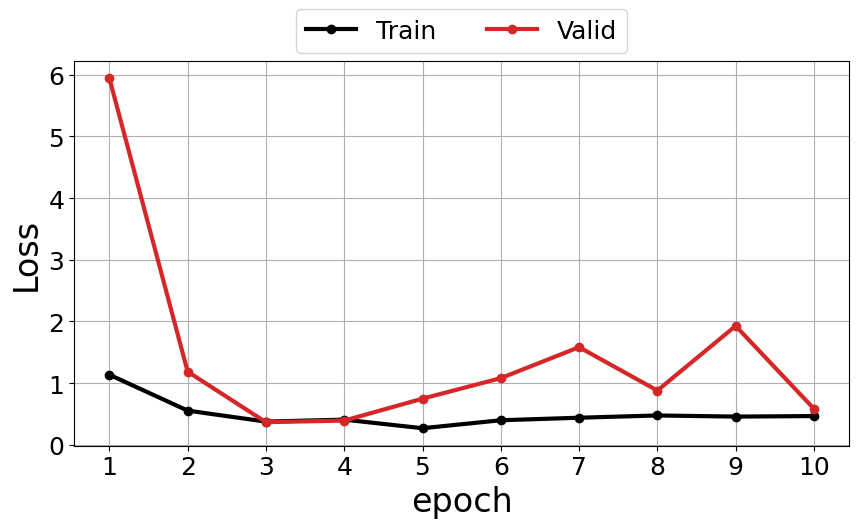

In [53]:
my_classifier.plot_metric(y_axis=["epoch_loss_train", "epoch_loss_val"],
                         y_label="Loss",
                         legends=["Train", "Valid"])

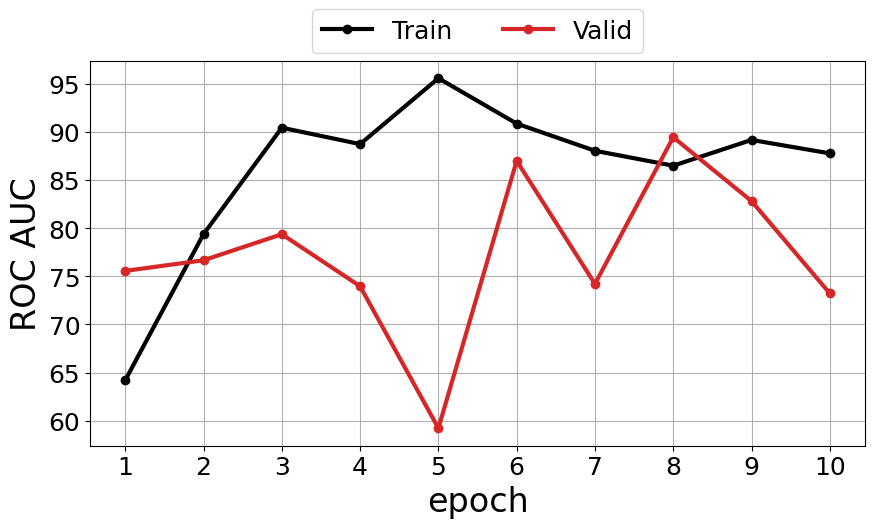

In [54]:
my_classifier.plot_metric(y_axis=["epoch_rocauc_macro_train", "epoch_rocauc_macro_val"],
                         y_label="ROC AUC",
                         legends=["Train", "Valid"],
                         colors=["k", "tab:red"])

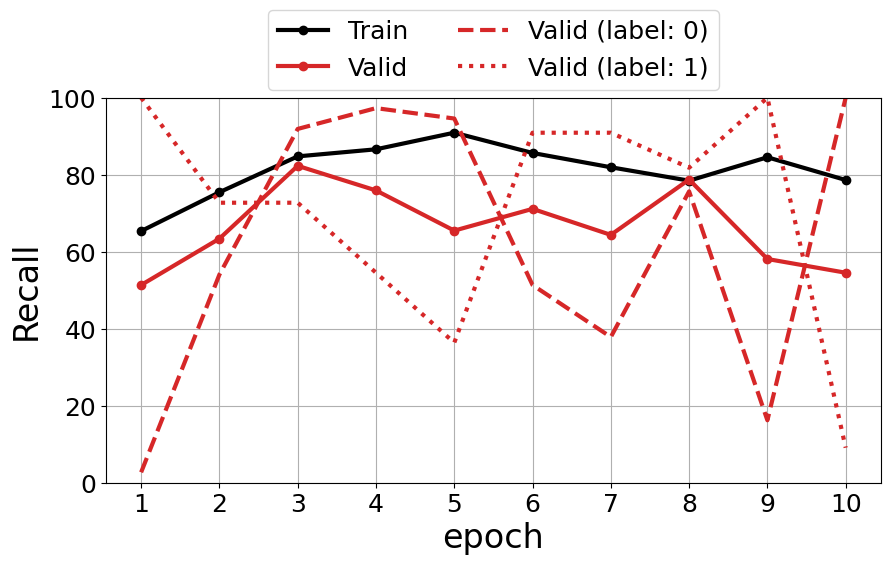

In [55]:
my_classifier.plot_metric(y_axis=["epoch_recall_macro_train", 
                                 "epoch_recall_macro_val", 
                                 "epoch_recall_0_val", 
                                 "epoch_recall_1_val"],
                         y_label="Recall",
                         legends=["Train", 
                                  "Valid", 
                                  "Valid (label: 0)",
                                  "Valid (label: 1)",],
                         colors=["k", "tab:red", "tab:red", "tab:red"],
                         styles=["-", "-", "--", ":"],
                         markers=["o", "o", "", ""],
                         plt_yrange=[0, 100])

# Model inference

Here, we show how to load an already trained/fine-tuned model and a dataset and then do model inference.

## Load patches and add metadata

In [56]:
from mapreader import load_patches

In [57]:
my_maps = load_patches("./patches_100_pixel/*74488689*png", 
                      parent_paths="./maps/map_74488689.png")

my_maps.add_metadata("./maps/metadata.csv", ignore_mismatch=True)
my_maps.add_metadata("patch_df.csv", tree_level="patch", ignore_mismatch=True)

0it [00:00, ?it/s]
100%|████████████████████████████████████████████████████████████████████| 4275/4275 [00:00<00:00, 18332.24it/s]


[WARNING] Duplicates found in metadata. Keeping only first instance of each duplicated value


In [58]:
parent_df, patch_df = my_maps.convert_images()

## Create dataset from patches

In [59]:
from mapreader import PatchDataset

In [60]:
patch_dataset = PatchDataset(patch_df, transform="val")

In [61]:
my_classifier.load_dataset(patch_dataset, 
                            set_name="patches", 
                            batch_size=8, 
                            shuffle=False)

In [62]:
my_classifier.print_batch_info(set_name='patches')

[INFO] dataset: patches
        - items:        4275
        - batch size:   8
        - batches:      535



## Inference

In [63]:
my_classifier.inference(set_name="patches")

[INFO] Each training step will pass: ['patches'].
2023-06-05 13:29:08 599-JY5FK6 [INFO] patches  -- 11/11 --     8/4275 (  0.2% ) -- 
2023-06-05 13:29:08 599-JY5FK6 [INFO] patches  -- 11/11 --    48/4275 (  1.1% ) -- 
2023-06-05 13:29:09 599-JY5FK6 [INFO] patches  -- 11/11 --    88/4275 (  2.1% ) -- 
2023-06-05 13:29:09 599-JY5FK6 [INFO] patches  -- 11/11 --   128/4275 (  3.0% ) -- 
2023-06-05 13:29:10 599-JY5FK6 [INFO] patches  -- 11/11 --   168/4275 (  3.9% ) -- 
2023-06-05 13:29:10 599-JY5FK6 [INFO] patches  -- 11/11 --   208/4275 (  4.9% ) -- 
2023-06-05 13:29:11 599-JY5FK6 [INFO] patches  -- 11/11 --   248/4275 (  5.8% ) -- 
2023-06-05 13:29:11 599-JY5FK6 [INFO] patches  -- 11/11 --   288/4275 (  6.7% ) -- 
2023-06-05 13:29:11 599-JY5FK6 [INFO] patches  -- 11/11 --   328/4275 (  7.7% ) -- 
2023-06-05 13:29:12 599-JY5FK6 [INFO] patches  -- 11/11 --   368/4275 (  8.6% ) -- 
2023-06-05 13:29:12 599-JY5FK6 [INFO] patches  -- 11/11 --   408/4275 (  9.5% ) -- 
2023-06-05 13:29:13 599-JY

2023-06-05 13:29:37 599-JY5FK6 [INFO] patches  -- 11/11 --  2608/4275 ( 61.0% ) -- 
2023-06-05 13:29:37 599-JY5FK6 [INFO] patches  -- 11/11 --  2648/4275 ( 61.9% ) -- 
2023-06-05 13:29:38 599-JY5FK6 [INFO] patches  -- 11/11 --  2688/4275 ( 62.9% ) -- 
2023-06-05 13:29:38 599-JY5FK6 [INFO] patches  -- 11/11 --  2728/4275 ( 63.8% ) -- 
2023-06-05 13:29:39 599-JY5FK6 [INFO] patches  -- 11/11 --  2768/4275 ( 64.7% ) -- 
2023-06-05 13:29:39 599-JY5FK6 [INFO] patches  -- 11/11 --  2808/4275 ( 65.7% ) -- 
2023-06-05 13:29:39 599-JY5FK6 [INFO] patches  -- 11/11 --  2848/4275 ( 66.6% ) -- 
2023-06-05 13:29:40 599-JY5FK6 [INFO] patches  -- 11/11 --  2888/4275 ( 67.6% ) -- 
2023-06-05 13:29:40 599-JY5FK6 [INFO] patches  -- 11/11 --  2928/4275 ( 68.5% ) -- 
2023-06-05 13:29:41 599-JY5FK6 [INFO] patches  -- 11/11 --  2968/4275 ( 69.4% ) -- 
2023-06-05 13:29:41 599-JY5FK6 [INFO] patches  -- 11/11 --  3008/4275 ( 70.4% ) -- 
2023-06-05 13:29:42 599-JY5FK6 [INFO] patches  -- 11/11 --  3048/4275 ( 71.3

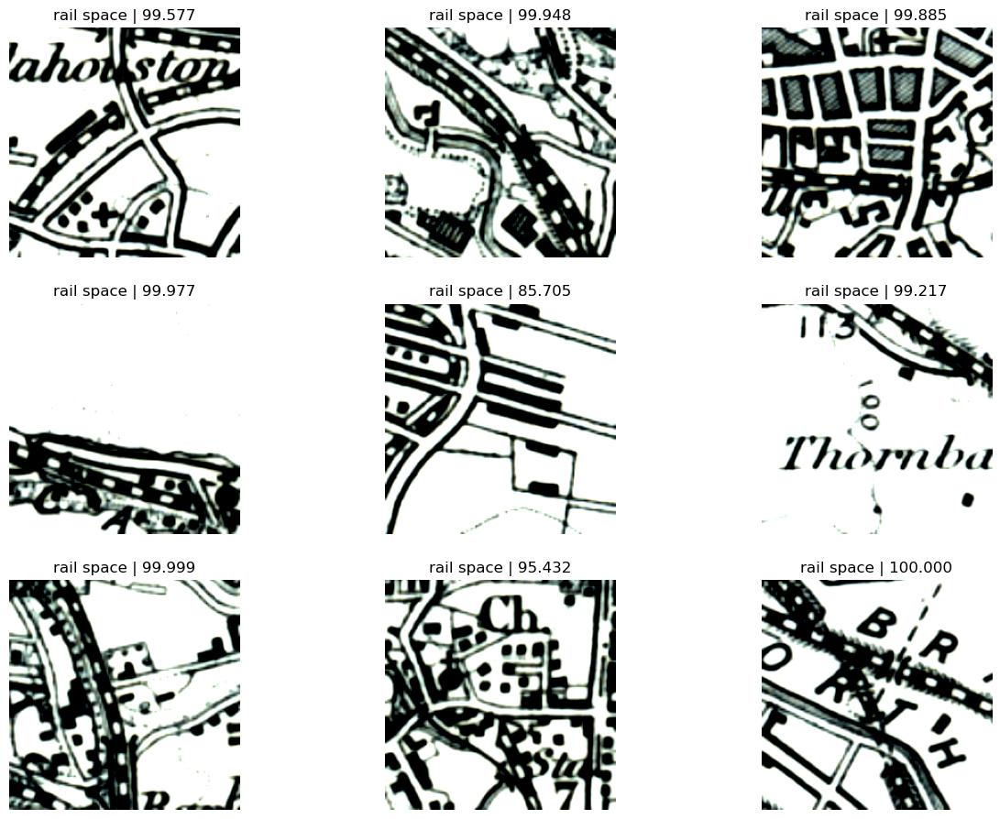

In [66]:
my_classifier.show_inference_sample_results(label="rail space",
                                       num_samples=9, 
                                       set_name="patches", 
                                       min_conf=80)

## Add predictions to dataframe

In [67]:
predictions_df = patch_dataset.patch_df

In [68]:
import numpy as np
import pandas as pd

predictions_df['predicted_label'] = my_classifier.pred_label
predictions_df['pred'] = my_classifier.pred_label_indices
predictions_df['conf'] = np.array(my_classifier.pred_conf).max(axis=1)

predictions_df.head()

,parent_id,image_path,pixel_bounds,shape,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_A,image_id,predicted_label,pred,conf
image_id,,,,,,,,,,,,,,,,,,,
patch-4800-4700-4900-4800-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(4800, 4700, 4900, 4800)","(100, 100, 4)","(-4.436203529094827, 56.016994037098904, -4.42...",EPSG:4326,POLYGON ((-4.42791642813847 56.016994037098904...,0.708448,0.694029,0.628624,1.0,0.192450,0.194525,0.179188,0.0,patch-4800-4700-4900-4800-#map_74488689.png#.png,No,0,0.832045
patch-1700-200-1800-300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(1700, 200, 1800, 300)","(100, 100, 4)","(-4.693103658741918, 55.81046025058123, -4.684...",EPSG:4326,POLYGON ((-4.6848165577855605 55.8104602505812...,0.902684,0.889986,0.817024,1.0,0.055550,0.056337,0.053893,0.0,patch-1700-200-1800-300-#map_74488689.png#.png,No,0,0.807598
patch-300-500-400-600-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(300, 500, 400, 600)","(100, 100, 4)","(-4.809123072130927, 55.82422916968241, -4.800...",EPSG:4326,POLYGON ((-4.800835971174569 55.82422916968241...,0.780055,0.768753,0.704215,1.0,0.118848,0.120624,0.114077,0.0,patch-300-500-400-600-#map_74488689.png#.png,No,0,0.953660
patch-2000-3500-2100-3600-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(2000, 3500, 2100, 3600)","(100, 100, 4)","(-4.668242355872845, 55.96191836069419, -4.659...",EPSG:4326,POLYGON ((-4.659955254916487 55.96191836069419...,0.835125,0.819675,0.744910,1.0,0.119352,0.119904,0.111668,0.0,patch-2000-3500-2100-3600-#map_74488689.png#.png,No,0,0.826236
patch-6200-4400-6300-4500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,"(6200, 4400, 6300, 4500)","(100, 100, 4)","(-4.320184115705819, 56.00322511799772, -4.311...",EPSG:4326,POLYGON ((-4.311897014749461 56.00322511799772...,0.671154,0.655859,0.590913,1.0,0.213728,0.216932,0.199242,0.0,patch-6200-4400-6300-4500-#map_74488689.png#.png,rail space,1,0.995773


## Add outputs to `MapImages` as metadata

In [69]:
my_maps.add_metadata(patch_df, tree_level="patch")

In [74]:
my_maps.add_shape()

[INFO] Add shape, tree level: parent


In [75]:
parent_df, patch_df = my_maps.convert_images()
parent_df.head()

,parent_id,image_path,patches,name,url,coordinates,crs,published_date,grid_bb,shape
image_id,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/MapReader/worked_examples/geo...,[patch-4800-4700-4900-4800-#map_74488689.png#....,map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.80128097118045, -4.21875, 56...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","(5632, 7424, 4)"


100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.48s/it]


[<Figure size 1500x1500 with 2 Axes>]

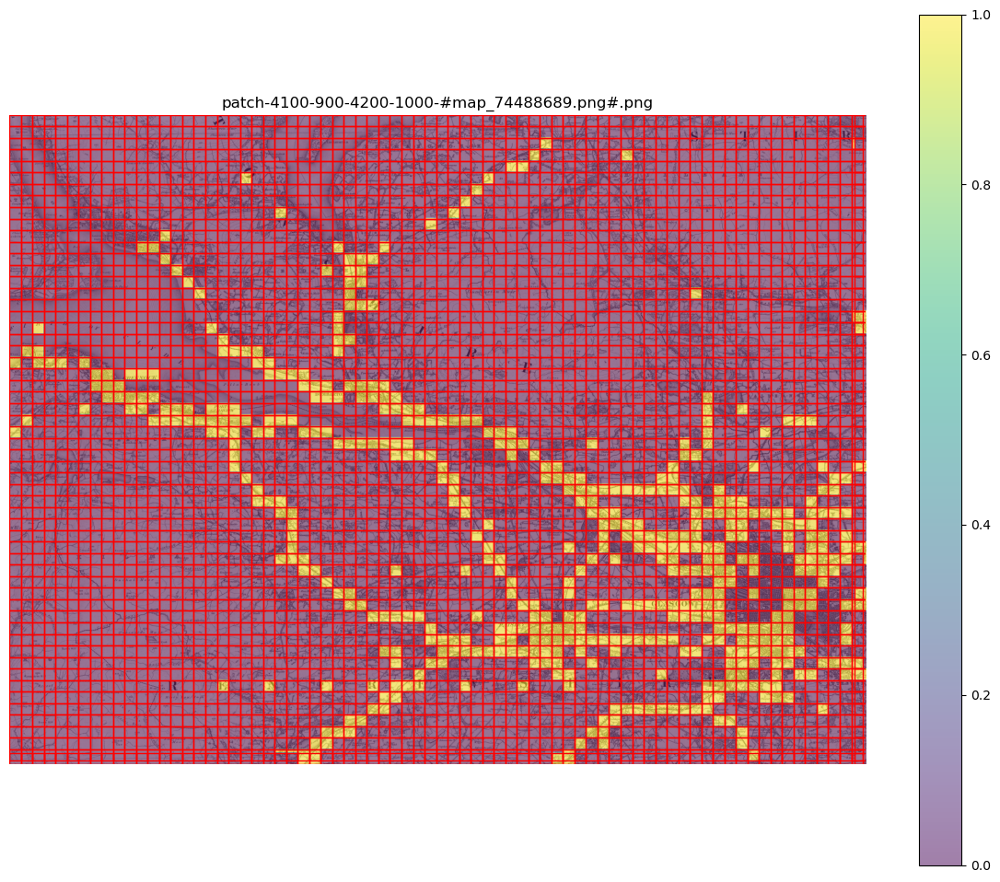

In [76]:
parent_list=my_maps.list_parents()

my_maps.show_parent(parent_list[0], 
                column_to_plot="pred",
                patch_border=True,
                plot_parent=True,
                figsize=(15, 15),
                alpha=0.5)

100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.51s/it]


[<Figure size 1500x1500 with 2 Axes>]

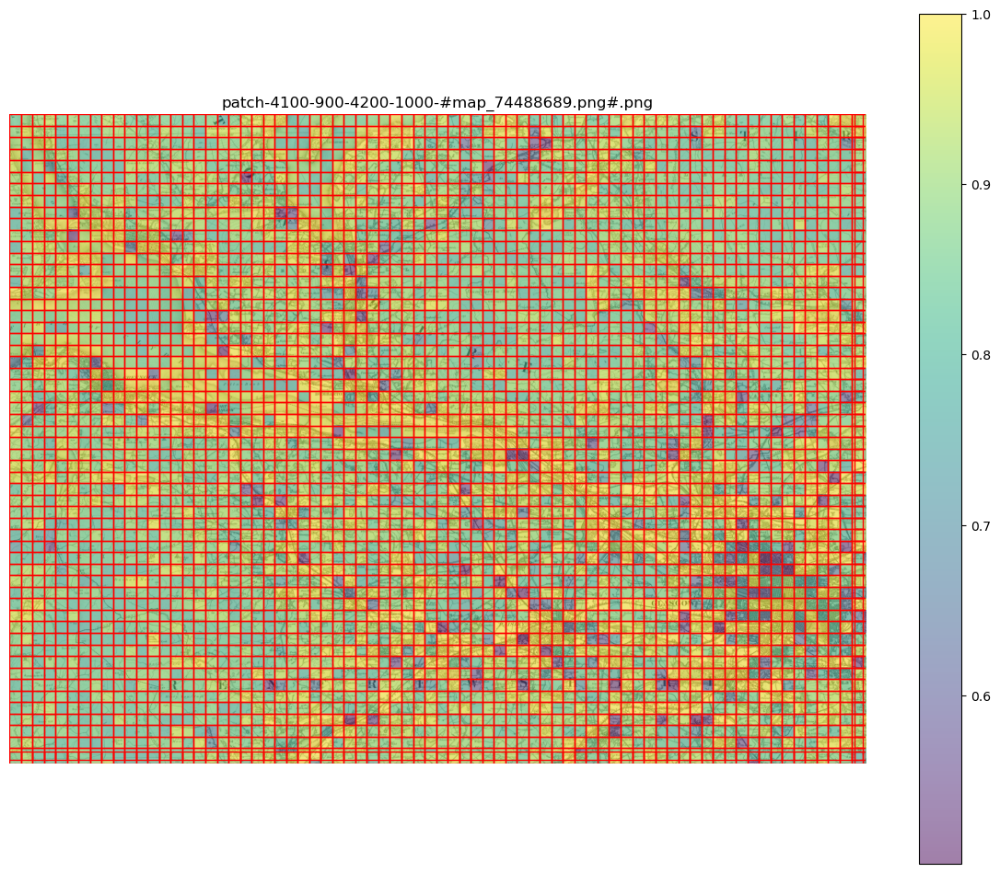

In [77]:
parent_list=my_maps.list_parents()

my_maps.show_parent(parent_list[0], 
                column_to_plot="conf",
                patch_border=True,
                plot_parent=True,
                figsize=(15, 15),
                alpha=0.5)